# Árvore de Decisão utilizando sklearn
Demonstração da influencia dos hyperparâmetros do algoritmo da árvore de decisão em um problema de classificação, utilizando a biblioteca do sklearn

**Densenvolvedor**: Alan Taranti

**Website**: [alantaranti.github.io](https://alantaranti.github.io)

**Email**: [alan.taranti@gmail.com](mailto:alan.taranti@gmail.com)

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris, load_wine
from sklearn.tree import DecisionTreeClassifier

## Iris

O conjunto de dados Iris foi usado, em 1936, no artigo de R.A. Fisher: The Use of Multiple Measurements in Taxonomic Problems.

Estes dados incluem três espécies de íris (setosa, virginica e versicolour ) com 50 amostras, bem como algumas propriedades sobre cada flor.

Uma espécie de flor é linearmente separável dos outras duas, mas as outras duas não são separadas linearmente uma da outra.

Atributos:
* **sepal length (cm)**: Comprimento da sépala
* **sepal width (cm)**: Largura da sépala
* **petal length (cm)**: Comprimento da pétala
* **petal width (cm)**: Largura da pétala

Fonte: [UC Irvine Machine Learning Repository](https://archive.ics.uci.edu/ml/datasets/Iris)

## Carregar o dataset
Utilizaremos apenas dois atributos, para fins didáticos (visualização)

In [2]:
# Carregar o Dataset
dataset = load_iris()

In [3]:
# Gerar um dicionario a partir dos dados
dataset.keys()
d = dict()
for i,item in enumerate(dataset['feature_names']):
    d[item] = dataset.data[:,i]

In [6]:
# Gerar o pandas a partir do dicionario
data = pd.DataFrame(d)
data['target'] = dataset.target
cols = list(data.columns)
cols.remove('sepal length (cm)')
cols.remove('sepal width (cm)')
data = data[cols]
data.head()

,petal length (cm),petal width (cm),target
0,1.4,0.2,0
1,1.4,0.2,0
2,1.3,0.2,0
3,1.5,0.2,0
4,1.4,0.2,0


## Plot do dataset
Eh possivel ver que a classe setosa é lineramente separável, enquanto as outras duas classe não são.

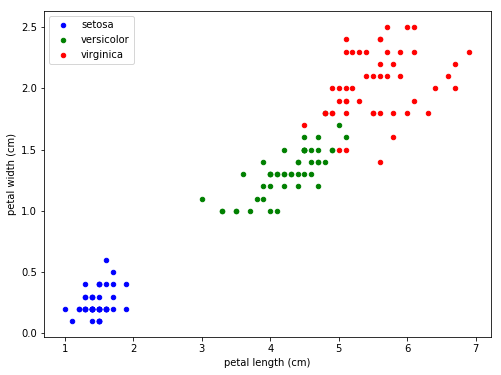

In [5]:
plt.figure(dpi=80)
colors = ['b','g','r']
ax = None
for i in range(len(colors)):
    ax = data[data['target']==i].plot.scatter(
        x='petal length (cm)',
        y='petal width (cm)',
        color=colors[i],
        label=dataset.target_names[i],
        ax=ax,
        figsize=(8, 6)
    );
    
plt.show()

## Árvore de Decisão

### Definir os conjuntos
Para executar o algoritmos de machine learning é necessário ao menos dois conjuntos:

    Treinamento: conjunto utilizado para aprender os pesos
    Teste: conjunto utilizado para simular dados novos (não vistos pelo modelo)

In [6]:
# Extrair todos os indices do conjunto
indices = list(data.index)
tam = len(indices)

# Permutar aleatóriamente os indices
indices = np.random.permutation(indices)

# Proporção dos conjuntos
treinamento = 0.7

# Conjunto De Treino
treinamento_indices = indices[0:int(treinamento*tam)] # Define os indices
data_train = data.iloc[treinamento_indices] # Define os dados, através dos indices
data_train = data_train.reset_index(drop=True) # Reseta o index
X_train = data_train.iloc[:,:-1].values # Define o X (Dados de treinamento)
y_train = data_train.iloc[:,-1].values # Define o y (Respostas do treinamento)

# Conjunto de Teste
inicio = data_train.shape[0] # Começa os indices do teste onde termina os indices da validação
teste_indices = indices[inicio:] # Define os indices
data_test = data.iloc[teste_indices] # Define os dados, através dos indices
X_test = data_test.iloc[:,:-1].values # Define o X (Dados de Teste)
y_test = data_test.iloc[:,-1].values # Define o y (Respostas do Teste)

In [7]:
data_train.head()

,petal length (cm),petal width (cm),target
0,3.9,1.1,1
1,4.5,1.5,1
2,3.3,1.0,1
3,5.0,2.0,2
4,4.8,1.8,2


### Inicializar o classificador

In [8]:
clf = DecisionTreeClassifier(random_state=0)

### Realizar o treinamento
Aqui é apresentado o conjunto de treinamento ao algoritmo onde é gerado um modelo para o problema

Como trata-se de um aprendizado supervisionado, apresentaremos, também, a resposta correta

In [9]:
# Realizar o Treinamento
clf.fit(X_train,y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=0,
            splitter='best')

### Medir o desempenho do modelo
Certo, nós treinamos o classificador, e agora?
Como descobrir se a nosso modelo está predizendo corretamente?

Umas das métricas de desempenho mais conhecidadas é a acurácia.
Que nada mais é do que comparar o resultado predido pelo modelo com a resposta correta.

In [10]:
# Predizer o conjunto de treinamento
pred = clf.predict(X_train)
print(pred)

[1 1 1 2 2 1 2 1 2 2 0 2 0 1 2 1 0 1 0 0 2 1 0 1 2 1 0 1 1 0 2 1 1 1 1 0 1
 0 0 0 2 1 2 2 0 2 2 2 0 0 2 2 2 1 0 0 2 2 0 1 2 1 1 0 2 2 1 0 0 2 1 1 1 1
 0 0 0 2 1 2 1 2 0 1 2 0 2 1 2 0 0 0 2 1 0 0 0 2 1 0 2 1 2 0 2]


In [11]:
# Resposta correta
print(y_train)

[1 1 1 2 2 1 2 1 2 2 0 2 0 1 2 1 0 1 0 0 2 1 0 1 2 1 0 1 1 0 2 1 1 1 1 0 1
 0 0 0 2 1 2 2 0 2 2 2 0 0 2 2 2 1 0 0 2 2 0 1 2 1 1 0 2 2 1 0 0 2 1 1 1 1
 0 0 0 2 1 2 1 2 0 1 2 0 2 1 2 0 0 0 2 1 0 0 0 2 1 0 2 1 2 0 2]


In [12]:
# Comparar os resultados
comparacao = pred == y_train
print(comparacao)

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True]


#### Acurácia no Conjunto de Treinamento
Que ótimo, nosso modelo acertou 100% o conjunto de treinamento.

In [13]:
# Acuracia
acuracia = sum(comparacao)/len(comparacao)
print('Acurácia:',str(round(acuracia*100,2))+'%')

Acurácia: 100.0%


#### Acurácia no Conjunto de Teste
Mas... Será que o modelo está generalizando bem?

O objetivo de todo algoritmo de machine learning é generalizar esse desempenho em exemplos não vistos.

Acertar o conjunto de treinamento é fácil, qual será o desempenho em exemplos não vistos?


In [14]:
# Acuracia
pred = clf.predict(X_test)
acuracia = sum(pred == y_test)/len(pred)
print('Acurácia:',str(round(acuracia*100,2))+'%')

Acurácia: 95.56%


Uau. Nosso modelo funciona!!!

Vamos tentar um exemplo somente

In [15]:
# Mostrar o exemplo
index = 0
print('Exemplo:',X_test[index])
print('Classe Correta - ID:',y_test[index])
print('Classe Correta - Nome:',dataset.target_names[y_test[index]])

# Fazer a predição
pred = clf.predict(X_test[index].reshape(1,-1))

# Mostrar a classe predita
print('\nClasse Predita - ID:',pred[0])
print('Classe Predita - Nome:',dataset.target_names[pred[0]])

Exemplo: [5.1 1.9]
Classe Correta - ID: 2
Classe Correta - Nome: virginica

Classe Predita - ID: 2
Classe Predita - Nome: virginica


### Visualizando a Árvore
Certo, fizemos nosso classificador, e ele deu bons resultados.

Vamos visualizar o que criamos?

#### Definir a função criação da imagem da Árvore

In [16]:
def show_tree(classificador,atributos_nomes,alvo_nomes):
    # Import
    from IPython.display import Image
    from graphviz import Source
    from sklearn.tree import export_graphviz

    # Gerar a arvore
    graph = Source(
        export_graphviz(classificador,
                        out_file=None,
                        feature_names=atributos_nomes,
                        class_names=alvo_nomes,
                        filled=True,
                        rounded=True,
                        special_characters=True
                       )
    )

    # Imprimir a arvore
    return Image(
        graph.pipe(format='png'),
        width=classificador.tree_.max_depth*200,
        height=classificador.tree_.max_depth*300
    )

#### Mostrar a ávore

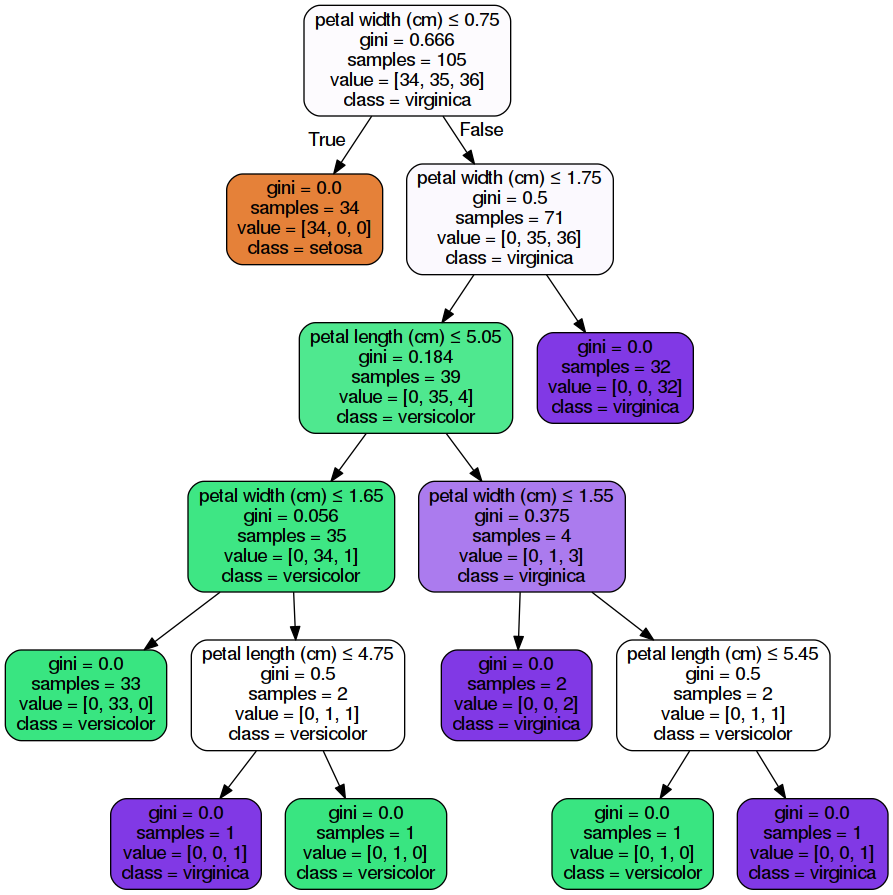

In [17]:
show_tree(clf,data.iloc[:,:-1].columns,dataset.target_names)

### Visualizando a Área de Decisão da Árvore de Decisão
PS: Não é redundância

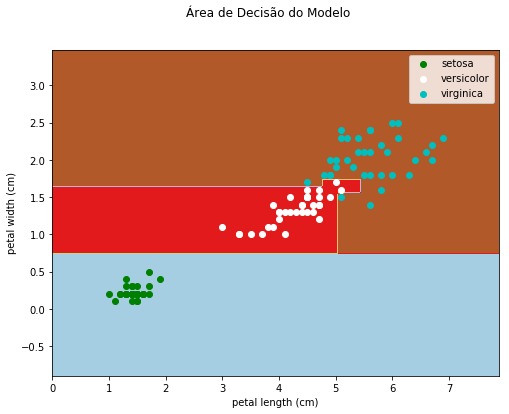

In [18]:
# Parameters
n_classes = 3
plot_colors = "gwc"
plot_step = 0.02

X = X_train
y = y_train

# Plot the decision boundary
plt.figure(figsize=(8,6))

x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, plot_step),
                     np.arange(y_min, y_max, plot_step))

Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)
cs = plt.contourf(xx, yy, Z, cmap=plt.cm.Paired)

plt.xlabel(data.columns[0])
plt.ylabel(data.columns[1])
plt.axis("tight")

# Plot the training points
for i, color in zip(range(n_classes), plot_colors):
    idx = np.where(y == i)
    plt.scatter(X[idx, 0], X[idx, 1], c=color, label=dataset.target_names[i],
                cmap=plt.cm.Paired)

plt.axis("tight")
plt.suptitle("Área de Decisão do Modelo")
plt.legend()
plt.show()

## E agora?
Agora que nós apredemos os conceitos e os aplicamos em um conjunto de dados com duas dimensões,
vamos testá-los com um conjunto de dados com 13 dimensões

## Wine
Estes dados são resultados de uma análise química de vinhos cultivados na mesma região na Itália mas derivados de três diferentes cultivares. A análise determinou a quantidade de 13 constituintes encontrados em cada um dos três tipos de vinhos.

Os atributos são:

    Alcohol
    Malic acid
    Ash
    Alcalinity of ash
    Magnesium
    Total phenols
    Flavanoids
    Nonflavanoid phenols
    Proanthocyanins
    Color intensity
    Hue
    OD280/OD315 of diluted wines
    Proline 

In [19]:
from sklearn import datasets

dataset = datasets.load_digits()

In [20]:
# Gerar um dicionario a partir dos dados
dataset.keys()
d = dict()
for i in range(dataset.data.shape[1]):
    d['pixel_'+str(i)] = dataset.data[:,i]

In [21]:
# Gerar o pandas a partir do dicionario
data = pd.DataFrame(d)
data['target'] = dataset.target
data.head()

,pixel_0,pixel_1,pixel_10,pixel_11,pixel_12,pixel_13,pixel_14,pixel_15,pixel_16,pixel_17,...,pixel_59,pixel_6,pixel_60,pixel_61,pixel_62,pixel_63,pixel_7,pixel_8,pixel_9,target
0,0.0,0.0,13.0,15.0,10.0,15.0,5.0,0.0,0.0,3.0,...,13.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,0.0,0.0,0.0,11.0,16.0,9.0,0.0,0.0,0.0,0.0,...,11.0,0.0,16.0,10.0,0.0,0.0,0.0,0.0,0.0,1
2,0.0,0.0,3.0,16.0,15.0,14.0,0.0,0.0,0.0,0.0,...,3.0,0.0,11.0,16.0,9.0,0.0,0.0,0.0,0.0,2
3,0.0,0.0,13.0,6.0,15.0,4.0,0.0,0.0,0.0,2.0,...,13.0,0.0,13.0,9.0,0.0,0.0,0.0,0.0,8.0,3
4,0.0,0.0,0.0,7.0,8.0,0.0,0.0,0.0,0.0,0.0,...,2.0,0.0,16.0,4.0,0.0,0.0,0.0,0.0,0.0,4


### Definir os conjuntos
Para executar o algoritmos de machine learning é recomendado haver três conjuntos:

    Treinamento: conjunto utilizado para aprender os pesos
    Validação: conjuntos utilizado para definir os hyperparametros do algoritmo
    Teste: conjunto utilizado para simular dados novos (não vistos pelo modelo)

In [145]:
# Extrair todos os indices do conjunto
indices = list(data.index)
tam = len(indices)

# Permutar aleatóriamente os indices
indices = np.random.permutation(indices)

# Proporção dos conjuntos
treinamento = 0.6
validacao = 0.2

# Conjunto De Treino
treinamento_indices = indices[0:int(treinamento*tam)] # Define os indices
data_train = data.iloc[treinamento_indices] # Define os dados, através dos indices
data_train = data_train.reset_index(drop=True) # Reseta o index
X_train = data_train.iloc[:,:-1].values # Define o X (Dados de treinamento)
y_train = data_train.iloc[:,-1].values # Define o y (Respostas do treinamento)

# Conjunto de Validação
inicio = len(treinamento_indices) # Começa os indices da validação onde termina os indices da treinamento
validacao_indices = indices[inicio:inicio+int(validacao*tam)] # Define os indices
data_val = data.iloc[validacao_indices] # Define os dados, através dos indices
X_val = data_val.iloc[:,:-1].values # Define o X (Dados de Validação)
y_val = data_val.iloc[:,-1].values # Define o y (Respostas da Validação)

# Conjunto de Teste
inicio = len(validacao_indices) + data_train.shape[0] # Começa os indices do teste onde termina os indices da validação
teste_indices = indices[inicio:] # Define os indices
data_test = data.iloc[teste_indices] # Define os dados, através dos indices
X_test = data_test.iloc[:,:-1].values # Define o X (Dados de Teste)
y_test = data_test.iloc[:,-1].values # Define o y (Respostas do Teste)

In [146]:
data_train.head()

,pixel_0,pixel_1,pixel_10,pixel_11,pixel_12,pixel_13,pixel_14,pixel_15,pixel_16,pixel_17,...,pixel_59,pixel_6,pixel_60,pixel_61,pixel_62,pixel_63,pixel_7,pixel_8,pixel_9,target
0,0.0,0.0,12.0,12.0,7.0,16.0,6.0,0.0,0.0,4.0,...,16.0,12.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,7
1,0.0,0.0,5.0,16.0,16.0,5.0,0.0,0.0,0.0,6.0,...,7.0,0.0,16.0,2.0,0.0,0.0,0.0,0.0,0.0,1
2,0.0,0.0,9.0,9.0,9.0,15.0,0.0,0.0,0.0,0.0,...,13.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7
3,0.0,0.0,0.0,12.0,16.0,8.0,0.0,0.0,0.0,0.0,...,4.0,0.0,13.0,2.0,0.0,0.0,0.0,0.0,0.0,4
4,0.0,2.0,16.0,10.0,5.0,4.0,1.0,0.0,0.0,6.0,...,15.0,11.0,8.0,0.0,0.0,0.0,0.0,0.0,5.0,5


### Treinamento da Árvore de Decisão

In [147]:
X_train

array([[ 0.,  0., 12., ...,  0.,  0.,  0.],
       [ 0.,  0.,  5., ...,  0.,  0.,  0.],
       [ 0.,  0.,  9., ...,  0.,  0.,  0.],
       ...,
       [ 0.,  0.,  9., ...,  0.,  0.,  0.],
       [ 0.,  1., 16., ...,  0.,  0.,  8.],
       [ 0.,  0., 15., ...,  0.,  0.,  1.]])

In [148]:
# Realizar o Treinamento
clf = DecisionTreeClassifier(random_state=0)
clf.fit(X_train,y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=0,
            splitter='best')

### Desempenho

In [149]:
# Acuracia Treinamento
pred = clf.predict(X_train)
acuracia = sum(pred == y_train)/len(pred)
print('Acurácia - Treinamento:',str(round(acuracia*100,2))+'%')

# Acuracia Teste
pred = clf.predict(X_test)
acuracia = sum(pred == y_test)/len(pred)
print('Acurácia - Teste:',str(round(acuracia*100,2))+'%')

Acurácia - Treinamento: 100.0%
Acurácia - Teste: 81.94%


Opa, o que aconteceu aqui?

Tivemos uma taxa alta de acerto do conjunto de treinamento e uma baixa taxa de acerto no conjunto de teste.

Por quê?

### Identificando como melhorar o desempenho do algoritmo
    Overfitting: é estado do modelo estatístico que se ajusta em demasiado ao conjunto de dados/amostra.
        Isso gera alto desempenho no conjunto de treinamento e baixo desempenho no conjunto de teste
    Underfitting: é o estado do modelo estatístico que possui a hipótese menos complexa que a função.
        Isso gera baixo desempenho no conjunto de treinamento e no conjunto de teste

Como visualizar isso?

Com a curva de aprendizado

#### Learning Curve (Curva de Aprendizado)
Esta curva, plota o grafico "quantidade de elementos treinados" vs "taxa de acerto"

In [150]:
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=1, train_sizes=np.linspace(.1, 1.0, 5)):
    
    from sklearn.model_selection import learning_curve
    
    plt.figure(figsize=(8, 6))
    plt.title(title)
    
       
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    
    train_scores_mean = np.mean(train_scores, axis=1)
    
    train_scores_std = np.std(train_scores, axis=1)
    
    test_scores_mean = np.mean(test_scores, axis=1)
    
    test_scores_std = np.std(test_scores, axis=1)
    
    if ylim is not None:
        plt.ylim(*ylim)
    else:
        plt.ylim(round(min([np.min(train_scores),np.min(test_scores)]),2)-0.01,1.01)
    
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

Observando a curva de aprendizado é possivel perceber o modelo está em overfitting.

O desempenho no conjunto de treinamento é bem maior do o do conjunto de cross-validação.

Para resolver esse problema, nós devemos diminuir a complexidade do nosso modelo.

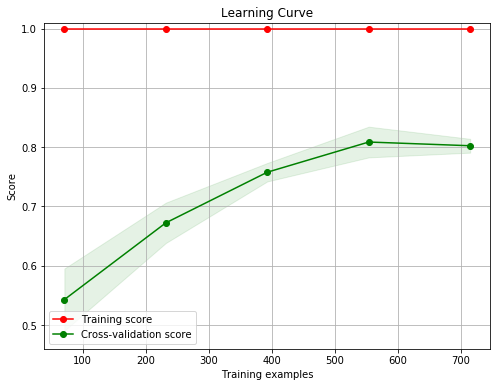

In [151]:
title = "Learning Curve"
plt = plot_learning_curve(clf, title, X_train, y_train, n_jobs=-1)
plt.show()

### Como diminuir a complexidade do modelo?
Em cada algoritmo, existem maneiras diferentes de diminuir a complexidade do modelo.

Nas árvores de decisão, alguns são:

    max_depth - Altura máxima da árvore
    min_samples_split - Número mínimo de amostras requeridas para dividir um nó interno
    min_samples_leaf - Número mínimo de amostras requeridas pra ser um nó folha

#### Mostrar a Árvore gerada pelo modelo

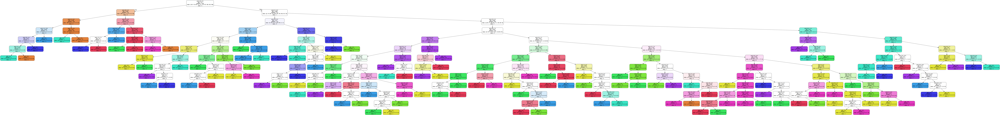

In [152]:
show_tree(clf,data.iloc[:,:-1].columns,[str(w) for w in dataset.target_names])

#### Reduzir a altura da árvore
Reduzindo a altura da árvore, a acurácia duminuiu no conjunto de treinamento, porém aumentou no conjunto de teste

In [158]:
# Realizar o Treinamento com altura máxima de 9
clf = DecisionTreeClassifier(random_state=0,max_depth=9)
clf.fit(X_train,y_train)

# Acuracia Treinamento
pred = clf.predict(X_train)
acuracia = sum(pred == y_train)/len(pred)
print('Acurácia - Treinamento:',str(round(acuracia*100,2))+'%')

# Acuracia Teste
pred = clf.predict(X_test)
acuracia = sum(pred == y_test)/len(pred)
print('Acurácia - Teste:',str(round(acuracia*100,2))+'%')

Acurácia - Treinamento: 96.01%
Acurácia - Teste: 82.5%


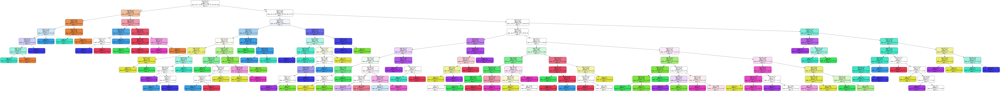

In [159]:
show_tree(clf,data.iloc[:,:-1].columns,[str(w) for w in dataset.target_names])

#### Aumentar o número mínimo de amostras requeridas para dividir um nó interno
Aumentando o número mínimo de amostras requeridas para dividir um nó interno, diminuiu a acurácia do conjunto de teste e treinamento

In [191]:
# Realizar o Treinamento com min_samples_split de 18
clf = DecisionTreeClassifier(random_state=0,min_samples_split=18)
clf.fit(X_train,y_train)

# Acuracia Treinamento
pred = clf.predict(X_train)
acuracia = sum(pred == y_train)/len(pred)
print('Acurácia - Treinamento:',str(round(acuracia*100,2))+'%')

# Acuracia Teste
pred = clf.predict(X_test)
acuracia = sum(pred == y_test)/len(pred)
print('Acurácia - Teste:',str(round(acuracia*100,2))+'%')

Acurácia - Treinamento: 90.17%
Acurácia - Teste: 80.0%


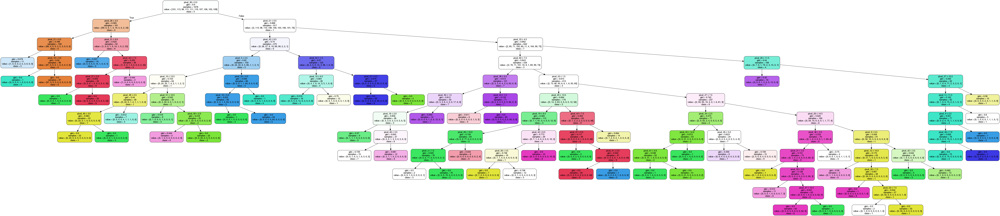

In [192]:
show_tree(clf,data.iloc[:,:-1].columns,[str(w) for w in dataset.target_names])

#### Aumentar o número mínimo de amostras requeridas pra ser um nó folha
Aumentando o número mínimo de amostras requeridas pra ser um nó folha, diminuiu a acurácia do conjunto de treinamento e não aumentou a acurácia no conjunto de teste

In [209]:
# Realizar o Treinamento com min_samples_leaf de 
clf = DecisionTreeClassifier(random_state=0,min_samples_leaf=3)
clf.fit(X_train,y_train)

# Acuracia Treinamento
pred = clf.predict(X_train)
acuracia = sum(pred == y_train)/len(pred)
print('Acurácia - Treinamento:',str(round(acuracia*100,2))+'%')

# Acuracia Teste
pred = clf.predict(X_test)
acuracia = sum(pred == y_test)/len(pred)
print('Acurácia - Teste:',str(round(acuracia*100,2))+'%')

Acurácia - Treinamento: 94.71%
Acurácia - Teste: 82.5%


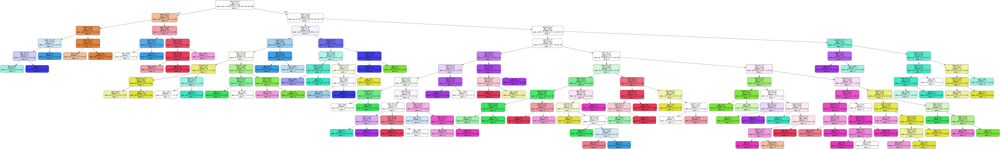

In [210]:
show_tree(clf,data.iloc[:,:-1].columns,[str(w) for w in dataset.target_names])

### Grid Search
Combina os hyperparametros para encontrar a combinação ótima

In [239]:
from sklearn.model_selection import RandomizedSearchCV

dt = DecisionTreeClassifier()

parameters = {
    'min_samples_leaf' : np.array(range(100))+1,
    'min_samples_split' : np.array(range(100))+2,
    'max_depth': np.array(range(100))+1
}

clf = RandomizedSearchCV(dt, parameters)

clf.fit(X_train, y_train)

print(clf.best_score_)

clf = clf.best_estimator_


# Acuracia Treinamento
pred = clf.predict(X_train)
acuracia = sum(pred == y_train)/len(pred)
print('Acurácia - Treinamento:',str(round(acuracia*100,2))+'%')

# Acuracia Teste
pred = clf.predict(X_test)
acuracia = sum(pred == y_test)/len(pred)
print('Acurácia - Teste:',str(round(acuracia*100,2))+'%')

0.7922077922077922
Acurácia - Treinamento: 95.45%
Acurácia - Teste: 82.22%


### Learning Curve
Como eh possível observar na curva de aprendizagem, o desempenho do novo modelo é superior ao modelo original.

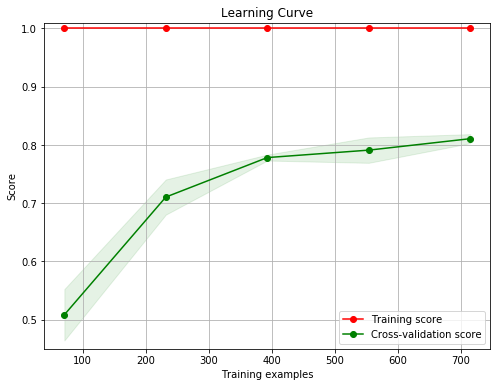

In [240]:
title = "Learning Curve"
plt = plot_learning_curve(dt, title, X_train, y_train, n_jobs=-1)
plt.show()